# Introduction

The NYC 311 Service Requests and Community District Indicators have both been obtained and exported. In this section, we'll merge the datasets on the community district/board columns, deal with missing values, exclude superfluous columns, and create summaries and visualizations to explore the data. 

# Loading Dependencies

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import re
import string

import nltk
from nltk.corpus import stopwords
from nltk import word_tokenize
from nltk.stem import WordNetLemmatizer 
from nltk.collocations import *
from nltk import FreqDist
from nltk.probability import FreqDist
from os import path
from PIL import Image
import matplotlib.pyplot as plt
import os
from wordcloud import WordCloud, STOPWORDS

from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import random

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


# Data Cleaning

### Excluding Superfluous Columns

Below, we load the 311 data from Google Drive using [GoogleAuth](https://pythonhosted.org/PyDrive/oauth.html) and read it into a pandas dataframe.

In [2]:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [3]:
path = '/content/drive/MyDrive/Colab Notebooks/311.csv'
df = pd.read_csv(path, index_col=0)

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning:

Columns (39,45,46) have mixed types.Specify dtype option on import or set low_memory=False.

/usr/local/lib/python3.6/dist-packages/numpy/lib/arraysetops.py:569: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



Let's now check the column data types and identify columns with missing values.

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1500000 entries, 0 to 1499999
Data columns (total 46 columns):
 #   Column                          Non-Null Count    Dtype  
---  ------                          --------------    -----  
 0   unique_key                      1500000 non-null  int64  
 1   created_date                    1500000 non-null  object 
 2   agency                          1500000 non-null  object 
 3   agency_name                     1500000 non-null  object 
 4   complaint_type                  1500000 non-null  object 
 5   descriptor                      1422438 non-null  object 
 6   location_type                   1237278 non-null  object 
 7   incident_zip                    1467586 non-null  float64
 8   incident_address                1437587 non-null  object 
 9   street_name                     1437527 non-null  object 
 10  cross_street_1                  1217249 non-null  object 
 11  cross_street_2                  1216469 non-null  object 
 12  

The dataset consists of float, integer, and object data types. Most of the columns that contain missing values appear to be associated with particular complaint types. Next, we overwrite the dataframe to include only the rows and columns of interest.

In [5]:
#eliminate rows without lat/long and location type data
df = df[df.latitude.notnull()]
df = df[df.longitude.notnull()]
df = df[df.descriptor.notnull()]

In [6]:
#exclude unnecessary columns
df = df[['created_date', 'complaint_type', 'agency', 'community_board', 
         'latitude', 'longitude', 'descriptor', 'borough']]


### Descriptions of Remaining Columns

The descriptions for every column are available on the dataset's NYCOpenData profile. The descriptions for the columns included in this analysis have been pasted below.
*   **Created Date**: Date service request(SR) was created
*   **Complaint Type**: This is the first level of a hierarchy identifying the topic of the incident or condition. Complaint Type may have a corresponding Descriptor (below) or may stand alone.
*   **Agency**: Acronym of responding City Government Agency
*   **Community Board**: Provided by geovalidation.
*   **Latitude**: Geo based Lat of the incident location
*   **Longitude**: eo based Long of the incident location
*   **Descriptor**: This is associated to the Complaint Type, and provides further detail on the incident or condition. Descriptor values are dependent on the Complaint Type, and are not always required in SR.
*   **Borough**: Provided by the submitter and confirmed by geovalidation.




### Reformatting Values for Consistency

If we look at unique values in the 'complaint type' column, we'll see that some values are in title case while others are in upper case.  

In [7]:
df.complaint_type.unique()

array(['Noise - Residential', 'Illegal Parking',
       'Noise - Street/Sidewalk', 'NonCompliance with Phased Reopening',
       'Blocked Driveway', 'Noise - Vehicle', 'Street Sign - Damaged',
       'Overgrown Tree/Branches', 'Animal-Abuse', 'Noise - Commercial',
       'Mass Gathering Complaint', 'Traffic Signal Condition',
       'Non-Emergency Police Matter', 'Rodent', 'Street Sign - Missing',
       'Noise - Park', 'Maintenance or Facility', 'Illegal Tree Damage',
       'Food Establishment', 'Street Condition', 'Street Light Condition',
       'Noise', 'HEAT/HOT WATER', 'UNSANITARY CONDITION',
       'Construction Lead Dust', 'GENERAL', 'Air Quality', 'ELECTRIC',
       'DOOR/WINDOW', 'PLUMBING', 'APPLIANCE',
       'Unsanitary Animal Facility', 'Drinking', 'Sidewalk Condition',
       'PAINT/PLASTER', 'Traffic', 'Water System', 'Curb Condition',
       'Indoor Sewage', 'WATER LEAK', 'Sewer', 'Outdoor Dining',
       'FLOORING/STAIRS', 'Drug Activity', 'Violation of Park Rules',


Below, all of the values in the column are converted to title case.

In [8]:
df.complaint_type = df.complaint_type.str.title()

The values in the 'agengy' column also have inconsistent formatting: all but one have abbreviated names.

In [9]:
df.agency.unique()

array(['NYPD', 'MAYORâ\x80\x99S OFFICE OF SPECIAL ENFORCEMENT', 'DOT',
       'DPR', 'DOHMH', 'DEP', 'HPD', 'EDC', 'TLC', 'DCA', 'DOE', 'DOB',
       'DSNY', 'DOITT'], dtype=object)

We'll convert the ''MAYOR'S OFFICE OF SPECIAL ENFORCEMENT'value to its abbreviated name, OSE:


In [10]:
def update_OSE(agency):

  """Takes in an agency name and converts to abbreviated form, if the agency is
     the Office of Special Enforcement."""

  if agency == 'MAYORâ\x80\x99S OFFICE OF SPECIAL ENFORCEMENT':
      return "OSE"
  else:
      return agency
    
df.agency = df.agency.map(lambda agency: update_OSE(agency))

Among noise-related complaints, only one does not specify the noise source:

In [11]:
noise_columns = []

for i in df.complaint_type:
   if i.startswith('Noise') and i not in noise_columns:
     noise_columns.append(i)
noise_columns

['Noise - Residential',
 'Noise - Street/Sidewalk',
 'Noise - Vehicle',
 'Noise - Commercial',
 'Noise - Park',
 'Noise',
 'Noise - Helicopter',
 'Noise - House Of Worship']

We'll convert the generic 'Noise' value to 'Noise - Unspecified' so that its formatting matches that of similar complaint types.

In [12]:
#Label unspecified noise complaints as 'Noise - Unspecified'

def update_noise(complaint):

  """Takes in an complaint name and updates it, if it is
     an unspecified noise complaint."""

  if complaint == 'Noise':
    
    return "Noise - Unspecified"

  else:

    return complaint
    
df.complaint_type = df.complaint_type.map(
    lambda complaint: update_noise(complaint))

The 'created_date' column currently contains string values:


In [13]:
type(df.created_date[1])

str

The ```pandas.to_datetime()``` method converts each string value to a datetime object below.

In [14]:
#convert date column to datetime 
df['created_date'] = pd.to_datetime(df['created_date'], 
                                    format='%Y-%m-%dT%H:%M:%S.%f')

In [15]:
#check new data type for created_date column
type(df['created_date'][1])

pandas._libs.tslibs.timestamps.Timestamp

Using the datetime format, we can now create new columns with the day, month, day of week, and hour of each call. This will allow us to explore the independent relationship of each variable to other characteristics of the calls.

In [16]:
df['day'] = [str(i.date()) for i in df.created_date]
df['month'] = [int(i.month) for i in df.created_date]
df['day_of_week'] = [int(i.weekday()) for i in df.created_date]
df['hour'] = [int(i.hour) for i in df.created_date]

The calls are currently ordered in the dataframe from most-least recent. For data visualization purposes, we'll reindex the calls so that the linear, left-to-right presentation of time on an x-axis runs from least-most recent.

In [17]:
#reorder df from least-most recent calls
df = df.reindex(index=df.index[::-1])

To numerically encode the descriptor column in the modeling phase, we'll first need to exclude all values that aren't letters. Below, an empty space is substituted for all numbers and non-letter symbols.

In [18]:
num_pattern = r'[-()0-9]'
df.descriptor = df.descriptor.map(lambda x: re.sub(num_pattern, '', x).lower())
df.descriptor = df.descriptor.map(lambda x: re.sub('/', ' ', x))

In [19]:
#preview sample of unique descriptors with non-letters removed
df.descriptor.unique()[0:20]

array(['construction', 'no access', 'blocked hydrant',
       'posted parking sign violation', ' derelict vehicles',
       'manhole cover missing emergency sa',
       'noise: construction before after hours nm', 'banging pounding',
       'loud talking', 'social distancing', 'leak use comments wa',
       'noise: private carting noise nq', 'engine idling',
       'e dirty sidewalk', 'rodent sighting',
       'possible water main break use comments wa', 'loud music party',
       'rat sighting', 'dumpster  construction waste', 'dirty water we'],
      dtype=object)

### Merging the Community District Indicators Data

Now let's read in and preview the community district indicators data.

In [20]:
path = '//content/drive/MyDrive/Colab Notebooks/indicators.csv'
ind_df = pd.read_csv(path)

In [21]:
ind_df.head()

,the_geom,cartodb_id,the_geom_webmercator,acres,acs_tooltip,acs_tooltip_2,acs_tooltip_3,area_sqmi,borocd,cb_email,cb_website,cd_full_title,cd_short_title,cd_son_fy2018,cd_tot_bldgs,cd_tot_resunits,count_hosp_clinic,count_libraries,count_parks,count_public_schools,crime_count,crime_count_boro,crime_count_nyc,crime_per_1000,crime_per_1000_boro,crime_per_1000_nyc,female_10_14,female_15_19,female_20_24,female_25_29,female_30_34,female_35_39,female_40_44,female_45_49,female_5_9,female_50_54,female_55_59,female_60_64,female_65_69,female_70_74,...,pct_asian_nh,pct_bach_deg,pct_bach_deg_boro,pct_bach_deg_nyc,pct_black_nh,pct_clean_strts,pct_clean_strts_boro,pct_clean_strts_nyc,pct_foreign_born,pct_hh_rent_burd,pct_hh_rent_burd_boro,pct_hh_rent_burd_nyc,pct_hispanic,pct_other_nh,pct_served_parks,pct_white_nh,pop_2000,pop_2010,pop_acs,pop_change_00_10,poverty_rate,poverty_rate_boro,poverty_rate_nyc,puma,shared_puma,shared_puma_cd,son_issue_1,son_issue_2,son_issue_3,total_lot_area,under18_rate,under18_rate_boro,under18_rate_nyc,unemployment_boro,unemployment,unemployment_nyc,v_pluto,v_acs,v_facdb,v_crime
0,NaN,1,NaN,976.3,American Community Survey 2014-2018 5-Year Est...,American Community Survey (ACS) 2013-2017 5-ye...,2010 Census population counts for floodplain a...,1.5,101,man01@cb.nyc.gov,www1.nyc.gov/site/manhattancb1/index.page,Manhattan Community District 1,Manhattan CD 1,NaN,1725,45629,10,2,13,19,1055,26271,92480,6.8,16.1,11,1.1,2.4,3.9,7.2,6.5,4.7,3.6,2.9,1.8,2.3,2.4,2.6,2.4,1.8,...,15.5,82.2,60.8,37.4,2.2,95.4,94.1,95.1,23.3,30.1,36.4,44.2,6.5,3.6,100,72.2,34420,60978,154636,0.77,8.8,14.4,19.8,3810,True,Manhattan CD 2,Infrastructure resiliency,Traffic,Other,2881166.373,12.7,14.4,20.9,3.8,2.8,4.4,20v4,Y2014-2018,6/24/20,2019
1,NaN,2,NaN,865.9,American Community Survey 2014-2018 5-Year Est...,American Community Survey (ACS) 2013-2017 5-ye...,2010 Census population counts for floodplain a...,1.4,102,bgormley@cb.nyc.gov,www.nyc.gov/html/mancb2,Manhattan Community District 2,Manhattan CD 2,NaN,5256,60610,19,3,6,8,2313,26271,92480,15.0,16.1,11,1.1,2.4,3.9,7.2,6.5,4.7,3.6,2.9,1.8,2.3,2.4,2.6,2.4,1.8,...,15.5,82.2,60.8,37.4,2.2,96.3,94.1,95.1,23.3,30.1,36.4,44.2,6.5,3.6,100,72.2,93119,90016,154636,-0.03,8.8,14.4,19.8,3810,True,Manhattan CD 1,Parks,Schools,Senior services,2231472.120,12.7,14.4,20.9,3.8,2.8,4.4,20v4,Y2014-2018,6/24/20,2019
2,NaN,3,NaN,1076.9,American Community Survey 2014-2018 5-Year Est...,American Community Survey (ACS) 2013-2017 5-ye...,2010 Census population counts for floodplain a...,1.7,103,mn03@cb.nyc.gov,www.nyc.gov/html/mancb3,Manhattan Community District 3,Manhattan CD 3,NaN,4644,82557,41,5,13,42,2360,26271,92480,15.2,16.1,11,1.5,2.9,4.2,6.4,4.1,3.2,3.0,3.2,1.2,2.8,3.3,3.4,2.9,2.1,...,30.6,43.3,60.8,37.4,8.4,91.0,94.1,95.1,34.5,38.4,36.4,44.2,25.1,2.6,100,33.3,164407,163277,154995,-0.01,19.3,14.4,19.8,3809,False,NaN,Affordable housing,Senior services,Homelessness,2985434.526,11.4,14.4,20.9,3.8,3.6,4.4,20v4,Y2014-2018,6/24/20,2019
3,NaN,4,NaN,1131.6,American Community Survey 2014-2018 5-Year Est...,American Community Survey (ACS) 2013-2017 5-ye...,2010 Census population counts for floodplain a...,1.8,104,jbodine@cb.nyc.gov,www.nyc.gov/mcb4,Manhattan Community District 4,Manhattan CD 4,NaN,3829,85706,38,2,7,29,2792,26271,92480,18.1,16.1,11,0.9,1.7,4.0,7.2,6.4,3.8,3.0,2.9,1.0,2.3,2.7,2.7,2.1,2.1,...,17.2,74.1,60.8,37.4,5.2,95.6,94.1,95.1,30.8,33.9,36.4,44.2,15.5,3.0,94,59.1,87479,103245,154496,0.18,11.3,14.4,19.8,3807,True,Manhattan CD 5,Affordable housing,"Land use trends (zoning, development, neighbor...",Traffic,3110433.364,8.2,14.4,20.9,3.8,3.5,4.4,20v4,Y2014-2018,6/24/20,2019
4,NaN,5,NaN,1005.4,American Community Survey 2014-2018 5-Year Est...,American Community Survey (ACS) 2013-2017 5-ye...,2010 Census population counts for floodplain a...,1.6,105,office@cb5.org,www.cb5.org,Manhattan Community District 5,Manhattan CD 5,NaN,3127,49436,23,7,3,13,4538,26271,92480,29.4,16.1,11,0.9,1.7,4.0,7.2,6.4,3.8,3.0,2.9,1

In [22]:
ind_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59 entries, 0 to 58
Columns: 188 entries, the_geom to v_crime
dtypes: bool(1), float64(121), int64(51), object(15)
memory usage: 86.4+ KB


This dataset contains many columns, which have been narrowed down to a selection of development, demographic, economic and social variables below. Most of the column names are self-explanatory, but a a full list of column descriptions can be found in the 'Indicators Data Dictionary' file on any [community district profile](https://communityprofiles.planning.nyc.gov/).

In [23]:
ind_df = ind_df[[
'cd_short_title', 
'area_sqmi',
'count_hosp_clinic',
'count_libraries',
'count_parks',
'count_public_schools',
'crime_per_1000',
'female_15_19',
'female_20_24',
'female_25_29',
'female_30_34',
'female_35_39',
'female_40_44',
'female_45_49',
'female_50_54',
'female_55_59',
'female_60_64',
'male_10_14',
'male_15_19',
'male_20_24',
'male_25_29',
'male_30_34',
'male_35_39',
'male_40_44',
'male_45_49',
'male_50_54',
'male_55_59',
'male_60_64',
'under18_rate',
'over65_rate',
'lots_total',
'lots_vacant',
'pct_white_nh',
'pct_black_nh',
'pct_asian_nh',
'pct_other_nh',
'pct_hispanic',
'mean_commute',
'pop_change_00_10',
'pct_clean_strts',
'unemployment',
'poverty_rate',
'lep_rate_boro',
'pct_hh_rent_burd'
]]

Let's look at the summary statistics for each of the numeric variables in the dataset.

In [24]:
ind_df.describe().loc[['mean','std', 'min', 'max']]

,area_sqmi,count_hosp_clinic,count_libraries,count_parks,count_public_schools,crime_per_1000,female_15_19,female_20_24,female_25_29,female_30_34,female_35_39,female_40_44,female_45_49,female_50_54,female_55_59,female_60_64,male_10_14,male_15_19,male_20_24,male_25_29,male_30_34,male_35_39,male_40_44,male_45_49,male_50_54,male_55_59,male_60_64,under18_rate,over65_rate,lots_total,lots_vacant,pct_white_nh,pct_black_nh,pct_asian_nh,pct_other_nh,pct_hispanic,mean_commute,pop_change_00_10,pct_clean_strts,unemployment,poverty_rate,lep_rate_boro,pct_hh_rent_burd
mean,4.613559,22.898305,3.677966,6.915254,25.694915,10.205085,2.720339,3.540678,4.883051,4.398305,3.757627,3.313559,3.308475,3.318644,3.172881,2.988136,2.794915,2.720339,3.342373,4.601695,4.237288,3.538983,3.159322,3.083051,3.045763,2.861017,2.513559,20.872881,13.832203,14531.593220,458.000000,32.264407,21.822034,13.088136,2.927119,29.898305,41.238983,0.038475,94.064407,4.513559,19.940678,23.049153,44.723729
std,4.295164,13.101323,1.665478,4.035567,8.987068,4.627594,0.683243,0.844887,1.364848,1.113629,0.547787,0.368809,0.402273,0.563081,0.541973,0.529178,0.797285,0.788447,0.844904,1.219453,1.238450,0.827338,0.655249,0.448043,0.453463,0.467944,0.480466,5.383334,3.643816,11987.065263,581.954495,24.355979,22.333160,12.294884,2.074129,20.544053,6.309572,0.111801,3.076146,1.465518,6.824982,5.305637,7.550322
min,1.400000,1.000000,1.000000,1.000000,8.000000,2.600000,1.100000,1.800000,2.900000,3.000000,2.900000,2.600000,2.100000,1.800000,2.000000,2.000000,0.800000,1.100000,1.200000,2.700000,2.500000,2.500000,1.800000,2.100000,2.100000,2.000000,1.400000,8.200000,8.200000,1461.000000,25.000000,1.100000,1.000000,0.700000,1.200000,6.500000,25.400000,-0.100000,85.100000,2.000000,7.200000,10.900000,28.800000
max,21.500000,54.000000,9.000000,20.000000,47.000000,29.400000,4.200000,6.900000,8.400000,6.900000,5.600000,4.300000,4.000000,4.400000,4.200000,3.900000,4.800000,4.200000,5.600000,8.100000,7.300000,5.600000,5.300000,4.200000,4.000000,3.800000,3.300000,36.800000,23.900000,50434.000000,3364.000000,82.900000,86.600000,52.700000,14.900000,71.500000,51.100000,0.770000,99.100000,7.800000,35.600000,28.800000,60.300000


We can see that the average size of a community district is 4.6 miles, and that the average percentage of men and women in their 20s and 30s are higher than percentages for other age groups. On average, white residents make up about a third of the community districts' population, followed by hispanic, black, and asian residents. The average poverty rate is 19%, the average unemployment rate is 4.5%, and the average crime rate (for 7 major felonies) per 1000 residents is about 10. 

We'll format the community district column in this dataset such that it can be merged with the community board column in the 311 dataset. In NYC, community districts and their corresponding boards share the same number and borough. According to the webpage for [Queens Community Board 3](http://www.cb3qn.nyc.gov/1652), "each community district has a Community Board to oversee the delivery of city services and facilitate local governance." Currently, the values for community boards in df and community districts in ind_df are formatted differently:

In [25]:
df.community_board[0:10]

1499999        08 BRONX
1499998    11 MANHATTAN
1499997       06 QUEENS
1499996       05 QUEENS
1499995     05 BROOKLYN
1499994     05 BROOKLYN
1499993     17 BROOKLYN
1499992    08 MANHATTAN
1499991    04 MANHATTAN
1499990    10 MANHATTAN
Name: community_board, dtype: object

In [26]:
ind_df.cd_short_title[0:10]

0     Manhattan CD 1
1     Manhattan CD 2
2     Manhattan CD 3
3     Manhattan CD 4
4     Manhattan CD 5
5     Manhattan CD 6
6     Manhattan CD 7
7     Manhattan CD 8
8     Manhattan CD 9
9    Manhattan CD 10
Name: cd_short_title, dtype: object

Below, each community district short title is converted to uppercase, 'CD' is removed, and the number is moved to the front of the string, as in the 311 dataset.

In [27]:
#format community district string values so that they match community board vals 

pd.options.mode.chained_assignment = None 

for row in ind_df.index:
    upper = ind_df.at[row, "cd_short_title"].upper().replace(' CD','')
    num_first = "{}".format(upper[-2:] + ' ' + upper[:-2]).strip()
    ind_df.cd_short_title.loc[row] = num_first

The below function removes all 0's from the beginning of single-digit community board numbers in the 311 dataset. The subsequent list comprehension uses the function to update each value in the community board column.

In [28]:
def format_cb(cb_string):

  """Takes in a string value for a community board in the 311 dataframe. If the 
     string starts with '0', updates the string to contain every letter after 0."""  
  
  if cb_string.startswith('0'):
        return cb_string[1:]
  else:
        return cb_string

In [29]:
df.community_board = [format_cb(i) for i in df.community_board]

The community board column contains more unique values than the community district column, as shown below. 

In [30]:
len(df.community_board.unique())

76

In [31]:
len(ind_df.cd_short_title.unique())

59

We'll remove every row without a matching value by first labelling the non-matches and then overwriting the 311 dataset to exclude them.

In [32]:
def label_non_match(cb):

  """Takes in a community board value in the 311 dataset. If the value does not 
     match one of the unique values in the indicators dataset, returns the 
     string 'Non-match.'"""
    
  if cb in ind_df.cd_short_title.unique():
        return cb 
  
  else:
        return 'Non-match'

In [33]:
df.community_board = df.community_board.map(lambda cb: label_non_match(cb))

In [34]:
df = df[df.community_board != 'Non-match']

Now that all of the community district/board values have a match in both columns, we can create a column with a matching title in the indicators dataframe and perform an inner join with the 311 dataframe. 

In [35]:
#create new column with matching name to join data, and drop duplicate column
ind_df['community_board'] = ind_df.cd_short_title
df = pd.merge(df, ind_df, how='inner')

df.drop("cd_short_title", axis=1, inplace=True)

# Visualization 

## Value Count Bar Plots for Complaint Type and Agency

We'll use Plotly horizontal bar charts to visualize the distribution of calls across different complaint and agency categories. The top 30 most frequent complaint types and their corresponding counts are assigned to y and x lists, respectively. The lists are reversed so that the most frequent complaint types appear at the top of the chart. Then, the lists are converted to a dataframe and plotted with ```plotly.express.bar```.

In [36]:
complaint_type_x = list(df["complaint_type"].value_counts()[0:30])
complaint_type_y = list(df["complaint_type"].value_counts()[0:30].index)

complaint_type_x.reverse()
complaint_type_y.reverse()

complaint_type_count_df = pd.DataFrame({"Total Calls": complaint_type_x, "Complaint Type": complaint_type_y})

complaint_type_fig = px.bar(complaint_type_count_df, x="Total Calls", y="Complaint Type", 
             orientation='h',
             height=700, color = "Total Calls",
             color_discrete_sequence = px.colors.sequential.thermal)

complaint_type_fig.update_layout(hovermode='x',
                  title="Top 30 Most Frequent 311 Complaint Types",
                  font=dict(family="silom",
                  size=14, color="#58508d"))

complaint_type_fig.show()

Complaints related to noise, illegal parking, damaged tress, sanitation, and utilities are the most common. The same process is repeated below to create a bar chart for the agency value counts.

In [37]:
agency_x = list(df["agency"].value_counts())
agency_y = list(df["agency"].value_counts().index)

agency_x.reverse()
agency_y.reverse()

agency_count_df = pd.DataFrame({"Total Calls": agency_x, "Agency": agency_y})

agency_fig = px.bar(agency_count_df, x="Total Calls", y="Agency", 
             orientation='h',
             height=700, color = "Total Calls",
             color_discrete_sequence = px.colors.sequential.thermal)

agency_fig.update_layout(hovermode='x',
                  title="311 Call Counts by Agency",
                  font=dict(family="silom",
                  size=14, color="#58508d"))

agency_fig.show()

The New York Police Department (NYPD) responds to the majority of 311 calls in New York City. Conversely, the Dpt of Ed (DOE) and 
Dpt of Information Technology & Telecommunications (DOITT), respond to so few calls that their count does not appear on the above plot's hover data. In the modeling phase, these agencies will be oversampled so that the models will have enough data to recognize relevant calls.

## Animated Heatmaps for Call Volume by Month

To visualize how the daily call volume changes over time, we'll use Plotly's [Mapbox Density Heatmap](https://plotly.com/python/mapbox-density-heatmaps). Points are plotted on a map with given geographic coordinates, and the color of the points changes based on the proximity of surrounding points on the map. In the color scale used for this map, areas with a higher density of calls will appear yellow, while low-density areas will appear purple. The data is subsetted by month below so that a separate animation can be produced for each month.

**Note**: In order to reduce file size, the code to render the animations is commented out for every month except November. See repository for GIFs of the heatmaps, or run the code in a copy of this notebook. 

In [38]:
#Subset the data by month
June = df[df.month==6]
July = df[df.month==7]
August = df[df.month==8]
September = df[df.month==9]
October = df[df.month==10]
November = df[df.month==11]

In [39]:
def plot_calls(month_df, month):
  
    """Takes in a subsetted dataframe with the data for a given month, and the 
       name of the month as a string. Returns an animated mapbox density heatmap
       to show variation in call volume across time and space."""

    fig = px.density_mapbox(month_df, lat=month_df['latitude'], 
                            lon=month_df['longitude'], 
                            radius=2,
                            animation_frame=month_df["day"],
                            hover_name=None, 
                            hover_data=['complaint_type', 'community_board'],
                            width=550, height=550,
                            color_continuous_scale=px.colors.sequential.Inferno
                                                            )
    fig.update_layout(mapbox_style="carto-positron", mapbox_zoom=8.5, 
                  mapbox_center = {"lat": 40.6885, "lon": -73.93211},)
                      
    fig.layout.coloraxis.showscale = False    
                      
    fig.update_layout(title={
        'text': 'Call Volume in {}'.format(month),
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'}),

    font=dict(family="silom",
              size=14, color="#58508d")

    fig.update_layout(transition = {'duration': 10})

    fig.show()

In [84]:
# plot_calls(June, 'June')

In [85]:
# plot_calls(July, 'July')

In [86]:
# plot_calls(August, 'August')

In [87]:
# plot_calls(September, 'September')

In [88]:
# plot_calls(October, 'October')

In [90]:
plot_calls(November, 'November')

## Area Plots for Call Volume by Complaint Type
To visualize how the volume of calls changes over time for specific complaint type categories, we'll create some area plots. The below function creates a dataframe with the day-by-day call frequencies for a given complaint type, which will allow these values to be easily plotted.

In [42]:
def call_freq_df(df, complaint_type):
  
  """Takes in a dataframe and a complaint type. Returns a dataframe with dates 
     and the total number of calls related to the given complaint that were made 
     on each date."""
    
  subset = df[df.complaint_type==complaint_type]
    
  call_freqs_by_date = {}
    
  for d, i in zip(subset.created_date, subset.created_date.index):
        
      date = subset.created_date[i].date()
    
      if date not in call_freqs_by_date: 
            call_freqs_by_date[date] = 1
        
      else:
            call_freqs_by_date[date] += 1
    
  freq_df = pd.DataFrame.from_dict(call_freqs_by_date, orient='index', 
                                   columns=['{}'.format(complaint_type)])
    
  return freq_df

In [43]:
#create subsetted dataframes with complaints related to COVID-19
noncompliance = call_freq_df(df, 'Noncompliance With Phased Reopening')
mgc = call_freq_df(df, 'Mass Gathering Complaint')

In [44]:
#create and show area plot for COVID-related complaints
covid_fig = go.Figure()


covid_fig.add_trace(go.Scatter(
    x=noncompliance.index, y=noncompliance['Noncompliance With Phased Reopening'],
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='#FF0000'), name='Noncompliance W/ Phased Reopening',
    stackgroup='one' 
))

covid_fig.add_trace(go.Scatter(
    x=mgc.index, y=mgc['Mass Gathering Complaint'],
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='#000000'), name="Mass Gathering Complaint",
    stackgroup='two'
))
    

covid_fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.001
))


covid_fig.update_layout(title="COVID-19", height=700,
                  xaxis_title="Date",
                  yaxis_title="Total Calls", 

font=dict(family="silom",
          size=14, color="#58508d"))

covid_fig.show()

While calls related to non-compliance with phased reopening have been made at least since June, mass gathering complaints weren't recorded until October 19th, 2020. There were 587 total non-compliance complaints at their peak on July 17th.

In [45]:
#create subsetted dataframes with complaints related to noise
noise_r = call_freq_df(df, 'Noise - Residential')
noise_c = call_freq_df(df, 'Noise - Commercial')
noise_v = call_freq_df(df, 'Noise - Vehicle')
noise_s = call_freq_df(df, 'Noise - Street/Sidewalk')
noise = call_freq_df(df, 'Noise - Unspecified')

In [46]:
#create and show area plot
noise_fig = go.Figure()

noise_fig.add_trace(go.Scatter(
    x=noise_r.index, y=noise_r['Noise - Residential'],
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='#003f5c'), name="Noise - Residential",
    stackgroup='one'
))
    
noise_fig.add_trace(go.Scatter(
    x=noise_s.index, y=noise_s['Noise - Street/Sidewalk'],
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='#58508d'), name='Noise - Street/Sidewalk',
    stackgroup='two' 
))

noise_fig.add_trace(go.Scatter(
    x=noise_v.index, y=noise_v['Noise - Vehicle'],
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='#bc5090'), name='Noise - Vehicle',
    stackgroup='three' 
))


noise_fig.add_trace(go.Scatter(
    x=noise_c.index, y=noise_c['Noise - Commercial'],
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='#ffa600'), name='Noise - Commercial',
    stackgroup='four' 
))

noise_fig.add_trace(go.Scatter(
    x=noise.index, y=noise['Noise - Unspecified'],
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='#003f5c'), name="Noise - Unspecified",
    stackgroup='one'
))

noise_fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="right",
    x=0.99
))

noise_fig.update_layout(title="Noise", height=700,
                  xaxis_title="Date",
                  yaxis_title="Total Calls", 

font=dict(family="silom",
          size=14, color="#58508d"))

noise_fig.show()

Residential noise complaints are the most common among complaint types in this plot, followed by street/sidewalk, vehicle, and commercial noise complaints.

In [47]:
#create subsetted dataframes with complaints related to street and noise condition 
street = call_freq_df(df, 'Street Condition')
sidewalk = call_freq_df(df, 'Sidewalk Condition')

In [48]:
#create and show area plot
condition_fig = go.Figure()
condition_fig.add_trace(go.Scatter(
    x=street.index, y=street["Street Condition"],
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='#22DDD3'), name="Street Condition",
    stackgroup='one'
    ))
    
condition_fig.add_trace(go.Scatter(
    x=sidewalk.index, y=sidewalk["Sidewalk Condition"],
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='#6722DD'), name="Sidewalk Condition",
    stackgroup='one' 


))

condition_fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="right",
    x=0.99
))

condition_fig.update_layout(title="Sidewalk and Street Condition", height=700,
                  xaxis_title="Date",
                  yaxis_title="Total Calls", 

font=dict(family="silom",
          size=14, color="#58508d"))

condition_fig.show()

Calls related to sidewalk condition are more common than those related to street condition. There is no single peak for either complaint type. The total number of calls per day in these categories ranges from 30-391.

In [49]:
#create subsetted dataframes with complaints related to trees
dt = call_freq_df(df, 'Damaged Tree')
ot = call_freq_df(df, 'Overgrown Tree/Branches')
dd = call_freq_df(df, 'Dead/Dying Tree')
nt = call_freq_df(df, 'New Tree Request')

In [50]:
#create and show area plot (damaged trees)
damaged_tree_fig = go.Figure()
damaged_tree_fig.add_trace(go.Scatter(
    x=dt.index, y=dt["Damaged Tree"],
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='#228B22'), name="Damaged Trees",
    stackgroup='one'
    ))

damaged_tree_fig.update_layout(title="Damaged Trees", height=700,
                  xaxis_title="Date",
                  yaxis_title="Total Calls", 

font=dict(family="silom",
          size=14, color="#58508d"))

damaged_tree_fig.show()

The data for this complaint type was plotted independently because there is a clear peak that occurs on August 4th, with nearly 14k calls related to damaged trees. This peak causes the data for other dates to appear insignificant, despite the relatively high volume of complaints related to damaged trees that occured throughout the summer. One August 5th, there were more than 8k calls, followed by 3k on August 6th. This high call volume is attributable to [Hurricane Isaias](https://www.ny1.com/nyc/all-boroughs/weather/2020/08/04/isaias-new-york-city-august-4), which resulted in downed trees throughout the entire city in early August.

In [51]:
#create and show area plot (other tree-related complaints)
tree_fig = go.Figure()

tree_fig.add_trace(go.Scatter(
    x=ot.index, y=ot["Overgrown Tree/Branches"],
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='#8B4513'), name="Overgrown Tree/Branches",
    stackgroup='two'
    ))

tree_fig.add_trace(go.Scatter(
    x=dd.index, y=dd["Dead/Dying Tree"],
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='#C4285F'), name="Dead/Dying Tree",
    stackgroup='three'
    ))

tree_fig.add_trace(go.Scatter(
    x=nt.index, y=nt["New Tree Request"],
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='#491BE5'), name="New Tree Request",
    stackgroup='four'
    ))

tree_fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="right",
    x=0.99
))


tree_fig.update_layout(title="Other Tree-Related Requests", height=700,
                  xaxis_title="Date",
                  yaxis_title="Total Calls", 

font=dict(family="silom",
          size=14, color="#58508d"))

tree_fig.show()

New tree requests appear to be relatively uncommon. Calls related to overgrown and dying trees peaked at the same date as damaged trees, on August 4th, albeit with significantly fewer calls. 

In [52]:
#create subsetted dataframes with complaints related to parking/traffic/vehicles
driveway = call_freq_df(df, 'Blocked Driveway')
parking = call_freq_df(df, 'Illegal Parking')
abandoned = call_freq_df(df, 'Abandoned Vehicle')
traffic = call_freq_df(df, 'Traffic')

In [53]:
#create and show area plot
parking_fig = go.Figure()

parking_fig.add_trace(go.Scatter(
    x=parking.index, y=parking["Illegal Parking"],
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='#FCF73C'), name="Illegal Parking",
    stackgroup='two'
    ))

parking_fig.add_trace(go.Scatter(
    x=driveway.index, y=driveway["Blocked Driveway"],
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='#f288ac'), name="Blocked Driveway",
    stackgroup='one'
    ))

parking_fig.add_trace(go.Scatter(
    x=abandoned.index, y=abandoned["Abandoned Vehicle"],
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='#491BE5'), name="Abandoned Vehicle",
    stackgroup='three'
    ))

parking_fig.add_trace(go.Scatter(
    x=traffic.index, y=traffic["Traffic"],
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='#2BD51D'), name="Traffic",
    stackgroup='four'
    ))

parking_fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
))

parking_fig.update_layout(title="Vehicles and Traffic",
                  xaxis_title="Date",
                  yaxis_title="Total Calls", 


font=dict(family="silom",
          size=14, color="#58508d"))

parking_fig.show()

Illegal parking complaints are the most common in the above graph, followed by blocked driveway complaints and abandoned vehicle complaints. Traffic-related calls never exceeded 30 per day.

## Visualizing Average Daily Call Volume

### Bubble Chart

Using variables from both datasets, it is possible to calculate the average number of daily calls per square mile in a given community district. We may expect larger community districts to recieve more calls, but dividing the average daily calls by square milage, as the below function does, can account for this relationship. 

In [54]:
def avg_calls_sqmi(df, community_board):

  """Takes in a dataframe and the name of a community board as a string. Returns 
     the average daily number of 311 calls that correspond to the given 
     community board, divided by the community board's area in square miles."""  
     
    
  subset = df[df.community_board == community_board]
    
  area_sqmi = int(subset.area_sqmi[:1])

  call_freqs_by_date = {}
    
  for i in subset.index:
        
      day = subset.day[i]
    
      if day not in call_freqs_by_date: 
          
        call_freqs_by_date[day] = 1
        
      else:
          
        call_freqs_by_date[day] += 1
    
  total = sum(call_freqs_by_date.values())

  length = len(call_freqs_by_date)

  daily_avg = total/length
    
  avg_per_sqmi = daily_avg/area_sqmi

  return avg_per_sqmi

The function is applied to each community board below to create a dataframe with all of the daily averages.

In [55]:
#create empty dictionary
daily_avg_dict_cb = {}

In [56]:
#loop through community boards and update the dictionary with averages
for cboard in df.community_board.unique():
  daily_avg_dict_cb[cboard] = 0
  daily_avg_dict_cb[cboard] += int(avg_calls_sqmi(df, cboard))

In [57]:
#create dataframe from above dict and arrange in descending order of averages 
daily_avg_cb_df = pd.DataFrame.from_dict(daily_avg_dict_cb, orient='index', columns=["Avg daily calls per sqmi"])
daily_avg_cb_df = daily_avg_cb_df.sort_values(by='Avg daily calls per sqmi', ascending=False)

In [58]:
#create community board column in above df to merge with the indicators df
daily_avg_cb_df['community_board'] = daily_avg_cb_df.index
ind_with_avg_calls = pd.merge(ind_df, daily_avg_cb_df, how='inner')

In [59]:
#create borough column to organize visualization by borough
ind_with_avg_calls['Borough'] = [i[2:].strip() for i in ind_with_avg_calls.community_board]

The bubble plot below visualizes the average daily calls per square mile for each community board. The color of the points varies based on borough, while the size varies based on the crime rate per 1000 residents. Larger points indicate a higher crime rate. This feature will allow for the visualization of any relationship between crime rate and daily average call volume.

In [60]:
bubble_fig = px.scatter(ind_with_avg_calls, x="community_board",  
                 y="Avg daily calls per sqmi", color="Borough", height=700,
                 size='crime_per_1000', size_max=90, color_discrete_sequence=[
                                        "lightsalmon", "lightseagreen", 
                                        "lightskyblue", "lightpink", 
                                        "lightslategray"])

bubble_fig.update_layout(hovermode='x',
                  title="Average Daily 311 Calls/Sq Mile",
                  xaxis_title="Community Board",
                  font=dict(family="silom",
                  size=14, color="#58508d", 
                  ))

bubble_fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="right",
    x=0.99
))

bubble_fig.show()

There is no clear relationship between crime rate and daily call volume, but Staten Island—which is the borough with the lowest call volume—also contains districts with some of the lowest crime rates. Manhattan and the Bronx are home to districts with the highest daily call averages.

### Scatterplots

Next, we'll create some scatterplots to examine possible relationships between daily average calls per square mile and other numeric variables in the data. Below, we create two additional numeric variables—the average hour and day of week for a district's calls—and add them to a dataframe with all numeric features.

In [61]:
#dictionary with community districts and average weekday of calls
weekdays = {}

def weekday_df_cb(df, community_board):
    
    subset = df[df.community_board == community_board]
    
    weekday_list = []

    for i in subset.index:
        
        day = subset.day_of_week[i]
          
        weekday_list.append(day)
    
    total = sum(weekday_list)

    length = len(weekday_list)

    avg = total/length
    
    return round(avg, 2)

for cboard in df.community_board.unique():
  weekdays[cboard] = 0
  weekdays[cboard] += weekday_df_cb(df, cboard)

In [62]:
#dictionary with community districts and average hour of calls
hours = {}

def hours_cb(df, community_board):
    
    subset = df[df.community_board == community_board]
    
    hour_list = []

    for i in subset.index:
        
        day = subset.hour[i]
          
        hour_list.append(day)
    
    total = sum(hour_list)

    length = len(hour_list)

    avg = total/length
    
    return round(avg, 2)

for cboard in df.community_board.unique():
  
  hours[cboard] = 0
  
  hours[cboard] += hours_cb(df, cboard)

In [63]:
#merge the average weekday with ind_with_avg_calls
avg_time_week = pd.DataFrame.from_dict(weekdays, orient='index', columns=["avg_time_week"])
avg_time_week['community_board'] = avg_time_week.index

ind_with_avg_calls = pd.merge(ind_with_avg_calls, avg_time_week, how='inner')

In [64]:
#merge the average hour with ind_with_avg_calls
avg_hr = pd.DataFrame.from_dict(hours, orient='index', columns=["avg_hr"])
avg_hr['community_board'] = avg_hr.index

ind_with_avg_calls = pd.merge(ind_with_avg_calls, avg_hr, how='inner')

In [65]:
#create dataframe with relevant features
features = ind_with_avg_calls.drop(['community_board'], axis=1)

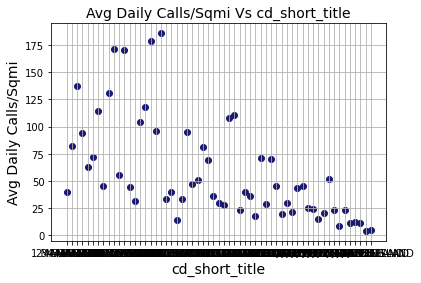

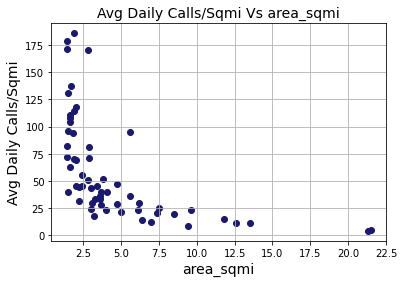

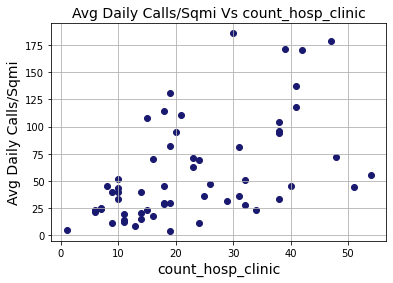

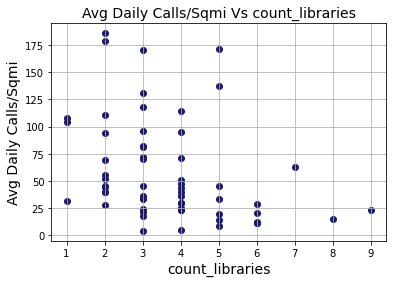

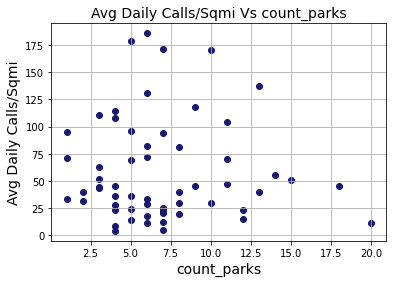

...

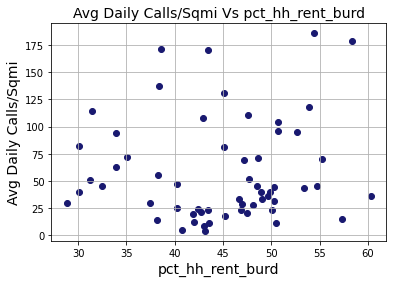

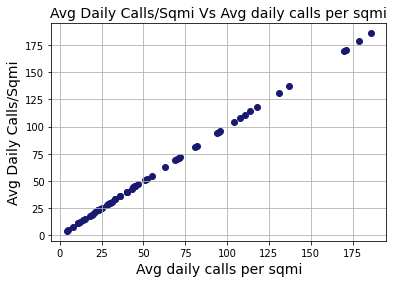

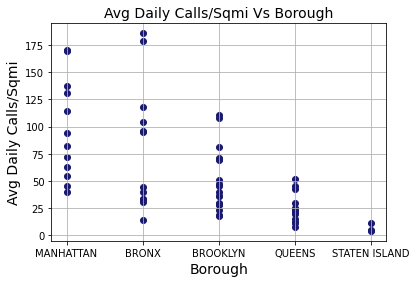

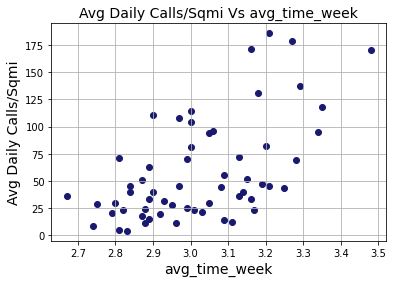

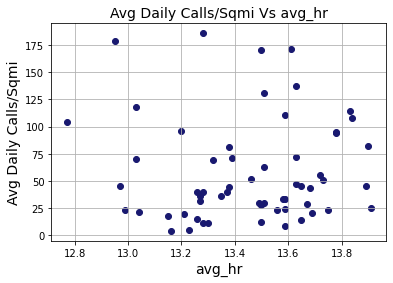

In [66]:
#plot features against avg daily calls per sqmi in scatterplots
for feat in features:
  plt.scatter(features[feat], features['Avg daily calls per sqmi'], color='midnightblue')
  plt.title('Avg Daily Calls/Sqmi Vs {}'.format(str(feat)), fontsize=14)
  plt.xlabel(str(feat), fontsize=14)
  plt.ylabel('Avg Daily Calls/Sqmi', fontsize=14)
  plt.grid(True)
  plt.show()

There is no clear linear relationship between the daily average calls per square mile and other numeric variables for the community districts. These plots nonetheless allow for some interesting observations. The districts with the highest percentage of clean streets, for example, also have the lowest call volume. The majority of districts have fewer than 500 vacant lots, and had a population change of less than .2 between 2000 and 2010. Two districts with a relatively high unemployment rate of around 7.5 have the higest call volume in the unemployment scatterplot. Finally, in the average time of week plot, higher values on the x-axis largely correspond to higher values on the y-axis. This suggests that most calls happen after Tuesday: calls that occur later in the week pull the "average time of week" value further toward 7.

## Correlation Heatmap

The above scatterplots only show whether there is a relationship between average daily calls and other variables. A correlation heatmap can highlight possible relationships between all variables in the dataset. To include agency in the heatmap, we'll dummy-encode the agency values. 

In [67]:
dummy_agency = pd.get_dummies(df.agency)
dummy_agency.drop('DOITT', axis=1, inplace=True)

In [68]:
#label encode boroughs
le = preprocessing.LabelEncoder()
borough_labels = le.fit_transform(df.borough)
df['borough_labels'] = borough_labels

In [69]:
df_with_dummy_agency = pd.concat([df, dummy_agency], axis=1)

In [70]:
df_with_dummy_agency.head()

,created_date,complaint_type,agency,community_board,latitude,longitude,descriptor,borough,day,month,day_of_week,hour,area_sqmi,count_hosp_clinic,count_libraries,count_parks,count_public_schools,crime_per_1000,female_15_19,female_20_24,female_25_29,female_30_34,female_35_39,female_40_44,female_45_49,female_50_54,female_55_59,female_60_64,male_10_14,male_15_19,male_20_24,male_25_29,male_30_34,male_35_39,male_40_44,male_45_49,male_50_54,male_55_59,male_60_64,under18_rate,over65_rate,lots_total,lots_vacant,pct_white_nh,pct_black_nh,pct_asian_nh,pct_other_nh,pct_hispanic,mean_commute,pop_change_00_10,pct_clean_strts,unemployment,poverty_rate,lep_rate_boro,pct_hh_rent_burd,borough_labels,DCA,DEP,DOB,DOE,DOHMH,DOT,DPR,DSNY,EDC,HPD,NYPD,OSE,TLC
0,2020-06-01 07:28:32,Covid-19 Non-Essential Construction,DOB,8 BRONX,40.879340,-73.920625,construction,BRONX,2020-06-01,6,0,7,3.3,10,5,6,19,8.8,2.2,3.3,3.8,3.9,3.5,3.0,3.4,3.2,3.3,3.4,2.7,2.7,3.3,3.8,3.5,2.9,2.9,2.9,2.6,2.8,2.2,21.1,19.0,4998,431,32.3,12.0,4.4,2.5,48.8,46.2,0.0,96.9,5.0,15.8,25.8,46.6,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,2020-06-01 07:39:46,Noise - Vehicle,NYPD,8 BRONX,40.890298,-73.907978,engine idling,BRONX,2020-06-01,6,0,7,3.3,10,5,6,19,8.8,2.2,3.3,3.8,3.9,3.5,3.0,3.4,3.2,3.3,3.4,2.7,2.7,3.3,3.8,3.5,2.9,2.9,2.9,2.6,2.8,2.2,21.1,19.0,4998,431,32.3,12.0,4.4,2.5,48.8,46.2,0.0,96.9,5.0,15.8,25.8,46.6,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,2020-06-01 07:57:46,Street Condition,DOT,8 BRONX,40.885368,-73.907276,pothole,BRONX,2020-06-01,6,0,7,3.3,10,5,6,19,8.8,2.2,3.3,3.8,3.9,3.5,3.0,3.4,3.2,3.3,3.4,2.7,2.7,3.3,3.8,3.5,2.9,2.9,2.9,2.6,2.8,2.2,21.1,19.0,4998,431,32.3,12.0,4.4,2.5,48.8,46.2,0.0,96.9,5.0,15.8,25.8,46.6,0,0,0,0,0,0,1,0,0,0,0,0,0,0
3,2020-06-01 07:58:16,Street Condition,DOT,8 BRONX,40.885269,-73.907309,pothole,BRONX,2020-06-01,6,0,7,3.3,10,5,6,19,8.8,2.2,3.3,3.8,3.9,3.5,3.0,3.4,3.2,3.3,3.4,2.7,2.7,3.3,3.8,3.5,2.9,2.9,2.9,2.6,2.8,2.2,21.1,19.0,4998,431,32.3,12.0,4.4,2.5,48.8,46.2,0.0,96.9,5.0,15.8,25.8,46.6,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,2020-06-01 08:05:43,Broken Parking Meter,DOT,8 BRONX,40.886087,-73.909832,graffiti,BRONX,2020-06-01,6,0,8,3.3,10,5,6,19,8.8,2.2,3.3,3.8,3.9,3.5,3.0,3.4,3.2,3.3,3.4,2.7,2.7,3.3,3.8,3.5,2.9,2.9,2.9,2.6,2.8,2.2,21.1,19.0,4998,431,32.3,12.0,4.4,2.5,48.8,46.2,0.0,96.9,5.0,15.8,25.8,46.6,0,0,0,0,0,0,1,0,0,0,0,0,0,0


Text(0.5, 1.0, 'Correlation Heatmap')

findfont: Font family ['silom'] not found. Falling back to DejaVu Sans.


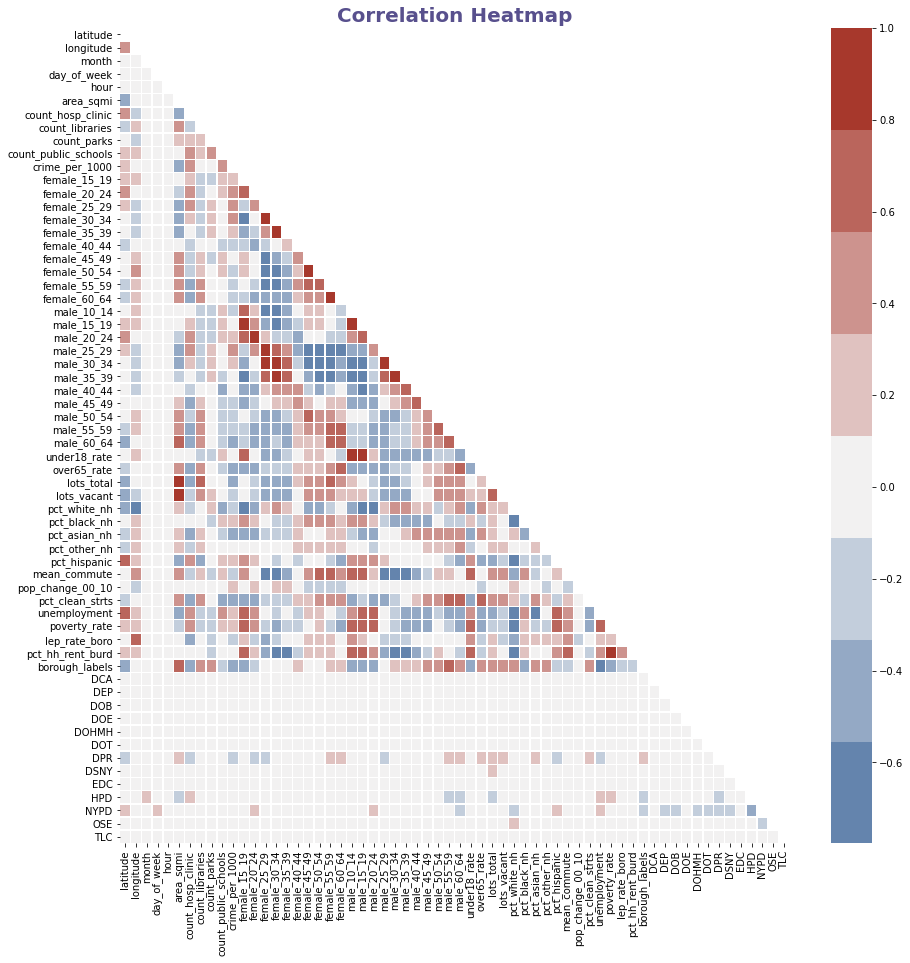

In [71]:
mask = np.zeros_like(df_with_dummy_agency.corr(), dtype=bool)


mask[np.triu_indices_from(mask)] = True


fig, ax = plt.subplots(figsize=(15,15))

cmap = sns.diverging_palette(250, 15, s=75, l=40, n=9)

sns.heatmap(df_with_dummy_agency.corr(),mask=mask,cmap=cmap,
            vmax=1,center=0, 
            linewidth=.5)

font_dict = {'fontsize': 20, 'family': 'silom', 
             'color': '#58508d', 'weight': 'bold'}

# ax.set_title('Correlation Heatmap', fontdict=font_dict)

plt.title('Correlation Heatmap', fontdict=font_dict)

None of the numeric variables appear to be strongly correlated with any agency category in either direction. All dark red (positive) or dark blue (negative) cells are at the intersection of the numeric varisbles themselves. Below, we create a dataframe to display which features have a correlation whose absolute value is at least .85.

In [72]:
Multicollinear_Features = []
Multicollinear_Corr = []

def check_multicollinearity(feature):
    for var, correlation in corr[feature].T.iteritems():
        if abs(correlation) >= .85 and var != feature:
            Multicollinear_Features.append([feature, var])
            Multicollinear_Corr.append(correlation)

corr = df_with_dummy_agency.corr()

for feature in corr:
    check_multicollinearity(feature)
    
MC_df = pd.DataFrame({'Correlations':Multicollinear_Corr, 
                      'Features': Multicollinear_Features}).sort_values(
                          by=['Correlations'], ascending=False)
MC_df

,Correlations,Features
5,0.942755,"[male_10_14, under18_rate]"
11,0.942755,"[under18_rate, male_10_14]"
2,0.896719,"[female_15_19, male_15_19]"
6,0.896719,"[male_15_19, female_15_19]"
9,0.891989,"[male_30_34, male_35_39]"
10,0.891989,"[male_35_39, male_30_34]"
1,0.891457,"[area_sqmi, lots_vacant]"
13,0.891457,"[lots_vacant, area_sqmi]"
0,0.875427,"[area_sqmi, lots_total]"
12,0.875427,"[lots_total, area_sqmi]"


Unsurprisingly, many of population variables with similar age ranges are highly correlated, as are the lot counts with the districts' square milage. We'll drop one variable in each of the multicollinear pairings above from the data.

In [73]:
df.drop(['male_10_14', 'female_15_19', 'male_35_39', 'area_sqmi', 'male_25_29'], axis=1, inplace=True)

## Descriptor Wordcloud

Using text from the descriptor column, we'll create a word cloud to visualize the most common words that appear in the calls' descriptions. First, the below function will clean the descriptor data and return a list of words found in the column (excluding stopwords).

In [74]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

def clean_words(text):
    
    """Takes in a string or iterable of strings, and returns a cleaned list 
       of words in the text that was passed in."""
    
    #join all strings in text and separate them by white space
    joined_text = " ".join(text) 
    
    #remove all characters that are not letters
    joined_text = re.sub('[^A-Za-z ]+', ' ', joined_text)
    
    #convert all words in list to their base form, or 'lemma'
    words = [WordNetLemmatizer().lemmatize(word) for word in joined_text]
    
    #create a list of individual strings for each word in the text 
    words = word_tokenize(joined_text)
    
    
    clean_words_list = []
    
    for word in words:
        
        #exclude words that don't contribute to the meaning of the text
        stopwords_list = stopwords.words('english')
        for w in ['http', 'com', 'amp', 'www']:
            stopwords_list.append(w)
        
        if len(word) > 2 and word not in stopwords_list:
            
            #populate clean words list with remaining words
            clean_words_list.append(word.lower())
    
    return clean_words_list

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [75]:
#run the function on the descriptor column
clean_descriptor = clean_words(df.descriptor)

The mask below, accessed via Vector Stock, allows the wordcloud to appear in the shape of New York City. For different mask options, a different set of max words and font sizes than the set used below may be optimal. 

In [76]:
#Image Attribution: Designed by vectorstock (Image #19210492 at VectorStock.com)
mask = np.array(Image.open("/content/drive/MyDrive/Colab Notebooks/vectorstock_19210492.png"))

findfont: Font family ['silom'] not found. Falling back to DejaVu Sans.


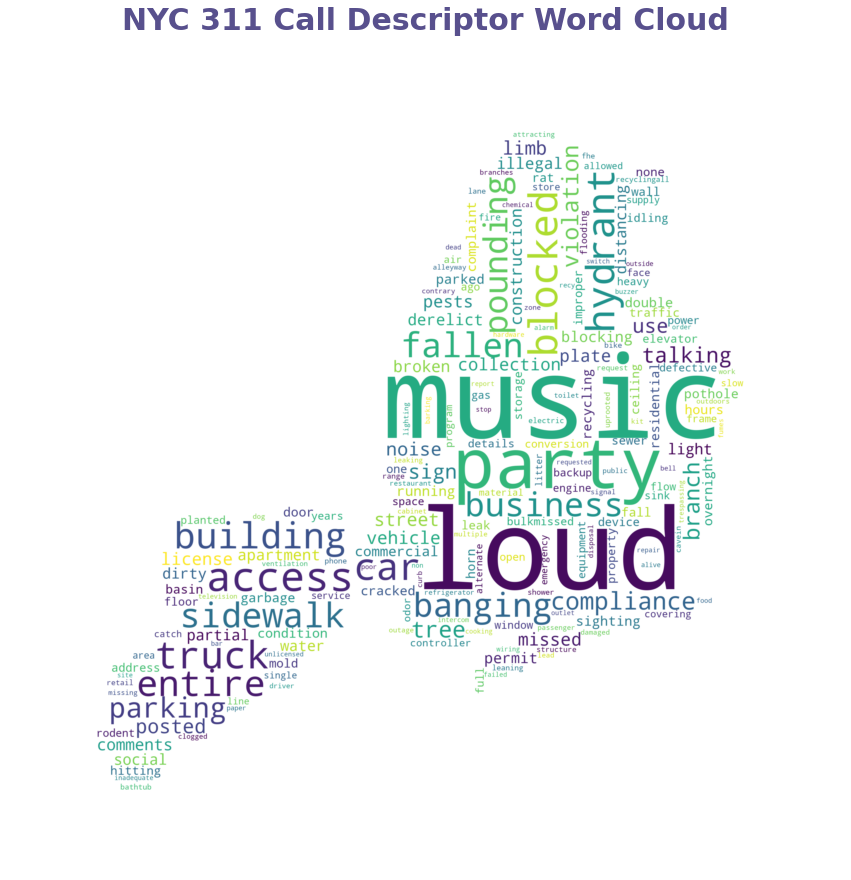

In [77]:
wc = WordCloud(background_color="white", mask=mask, max_words=200, 
               max_font_size =500, collocations=False)
clean_string = ','.join(clean_descriptor)
wc.generate(clean_string)

f = plt.figure(figsize=(15,17))
plt.axis("off")
image_colors = ImageColorGenerator(mask)
plt.imshow(wc, interpolation='bilinear')

font_dict = {'fontsize': 30, 'family': 'silom', 
             'color': '#58508d', 'weight': 'bold'}

plt.title('NYC 311 Call Descriptor Word Cloud', fontdict=font_dict)
plt.axis("off")
plt.show()

The words "music," "party," and "loud" are clearly the largest, which is no surprise given that noise complaints comprise the most common complaint categories. This wordcloud gives us an easily interpretable visual sense of how the frequency of certain complaint descriptions compare to others.  

# Exporting the Data

The code below can be used to export any of the dataframes used in this notebook to Google Drive. Simply change the file paths to paths of your choice.

In [78]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [79]:
df.to_csv('/content/gdrive/My Drive/Colab Notebooks/community_board_311.csv', header=True)
June.to_csv('/content/gdrive/My Drive/Colab Notebooks/June.csv', header=True)
July.to_csv('/content/gdrive/My Drive/Colab Notebooks/July.csv', header=True)
August.to_csv('/content/gdrive/My Drive/Colab Notebooks/August.csv', header=True)
September.to_csv('/content/gdrive/My Drive/Colab Notebooks/September.csv', header=True)
October.to_csv('/content/gdrive/My Drive/Colab Notebooks/October.csv', header=True)
November.to_csv('/content/gdrive/My Drive/Colab Notebooks/November.csv', header=True)
ind_with_avg_calls.to_csv('/content/gdrive/My Drive/Colab Notebooks/indicators_with_avg.csv', header=True)
noise_r.to_csv('/content/gdrive/My Drive/Colab Notebooks/noise_r.csv', header=True)
noise_c.to_csv('/content/gdrive/My Drive/Colab Notebooks/noise_c.csv', header=True)
noise_v.to_csv('/content/gdrive/My Drive/Colab Notebooks/noise_v.csv', header=True)
noise_s.to_csv('/content/gdrive/My Drive/Colab Notebooks/noise_s.csv', header=True)
noise.to_csv('/content/gdrive/My Drive/Colab Notebooks/noise.csv', header=True)
noncompliance.to_csv('/content/gdrive/My Drive/Colab Notebooks/noncompliance.csv', header=True)
mgc.to_csv('/content/gdrive/My Drive/Colab Notebooks/mgc.csv', header=True)

# References
[Bar Charts in Python](https://plotly.com/python/bar-charts/)

[Mapbox Density Heatmap in Python](https://plotly.com/python/mapbox-density-heatmaps/)

[Bubble Charts in Python](https://plotly.com/python/bubble-charts/)

[Filled Area Plots in Python](https://plotly.com/python/filled-area-plots/)

[Seaborn Heatmap](https://seaborn.pydata.org/generated/seaborn.heatmap.html)

[Masked Wordcloud](https://amueller.github.io/word_cloud/auto_examples/masked.html)